# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">0. Preambule</h1></span>

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">0.1 About this Notebook</h1></span>

<div class="alert alert-block alert-info">
    <font color = "red"></font> The following work uses data from <a href = "https://openproblems.bio/neurips_docs/about/about/"> NeurIPS 2021 Competition</a>, specially <strong>scATAC-seq</strong>. The notebook is quite large, i highly recommend to use the "Table of Contents". All the references are going to be at the end of this work. 
    I'm looking for a remote job to pay my undergraduate studies on <strong>molecular biology</strong>, if you wanna contact me, i leave me email: hiramcoria@gmail.com</div>

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">0.2 Installing Libraries</h1></span>

In [1]:
!pip install git+https://github.com/colomemaria/epiScanpy --ignore-installed
!pip install louvain
!pip install leidenalg
!pip install scvi-tools
!pip install scikit-misc

  Cloning https://github.com/colomemaria/epiScanpy to /tmp/pip-req-build-i1p1l5w8
  Running command git clone -q https://github.com/colomemaria/epiScanpy /tmp/pip-req-build-i1p1l5w8
  Resolved https://github.com/colomemaria/epiScanpy to commit 6b24431c831fe7b5bcb1d27ad3864f6cdecc58e0
     |████████████████████████████████| 91 kB 729 kB/s eta 0:00:01
     |████████████████████████████████| 2.0 MB 1.2 MB/s eta 0:00:01
     |████████████████████████████████| 11.2 MB 30.2 MB/s eta 0:00:01
     |████████████████████████████████| 11.3 MB 54.5 MB/s eta 0:00:01
     |████████████████████████████████| 38.1 MB 2.5 MB/s eta 0:00:011
     |████████████████████████████████| 292 kB 32.3 MB/s eta 0:00:01
     |████████████████████████████████| 4.1 MB 53.0 MB/s eta 0:00:01
     |████████████████████████████████| 23.2 MB 20.0 MB/s eta 0:00:01
     |████████████████████████████████| 9.8 MB 29.4 MB/s eta 0:00:01
     |████████████████████████████████| 1.9 MB 45.4 MB/s eta 0:00:01
     |██████████████████

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">0.3 Loading Libraries</h1></span>

In [2]:
### General ###
import os
import scipy
import random
import logging
import numpy as np
import pandas as pd

### Single-Cell ###
import scvi
import scanpy as sc
import anndata as ad
import episcanpy.api as epi

### Visualization ###
from colorama import Fore
import matplotlib.pyplot as plt

### PyTorch Ecosystem ###
import torch

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">0.4 Configuration</h1></span>

In [3]:
b_ = Fore.BLUE
c_ = Fore.CYAN
g_ = Fore.GREEN
m_ = Fore.MAGENTA
r_ = Fore.RED
y_ = Fore.YELLOW

In [4]:
plt.style.use("seaborn-paper")
sc.settings.set_figure_params(dpi = 80, color_map = "gist_earth")

In [5]:
seed = 42

def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed) # PyTorch
    scvi.settings.seed = seed # scvi-tools
    os.environ["PYTHONHASHSEED"] = str(seed)
    
    # If run on GPU
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
set_seed(seed)

# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">1. The Data</h1></span>

In [6]:
adata_atac = ad.read("../input/singlecell-multiomics/multiome_atac_processed_training.h5ad")
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 22463 observations and 116490 features.


In [7]:
adata_atac.obs

,nCount_peaks,atac_fragments,reads_in_peaks_frac,blacklist_fraction,nucleosome_signal,cell_type,pseudotime_order_ATAC,batch
TAGTTGTCACCCTCAC-1-s1d1,4031.0,5400,0.746481,0.003473,0.642468,Naive CD20+ B,NaN,s1d1
CTATGGCCATAACGGG-1-s1d1,8636.0,19266,0.448251,0.003126,1.220679,CD14+ Mono,NaN,s1d1
CCGCACACAGGTTAAA-1-s1d1,4674.0,6177,0.756678,0.001284,0.692573,CD8+ T,NaN,s1d1
TCATTTGGTAATGGAA-1-s1d1,2803.0,4019,0.697437,0.000714,0.633838,CD8+ T,NaN,s1d1
ACCACATAGGTGTCCA-1-s1d1,1790.0,2568,0.697040,0.003352,0.727660,CD16+ Mono,NaN,s1d1
...,...,...,...,...,...,...,...,...
TAGTAAGCAACTAGGG-8-s3d6,7239.0,10580,0.684216,0.000553,0.866142,HSC,0.23367,s3d6
TGGTCCTTCGGCTAGC-8-s3d6,16056.0,22771,0.705107,0.000810,0.964006,CD4+ T activated,NaN,s3d6
CGCTTGCGTTGTTGGA-8-s3d6,8388.0,14137,0.593337,0.000358,1.215227,pDC,NaN,s3d6
ACCCTCCCAGCCAGTT-8-s3d6,1001.0,1381,0.724837,0.000000,0.714286,CD8+ T,NaN,s3d6


In [8]:
adata_atac.var

,feature_types
chr1-9776-10668,ATAC
chr1-180726-181005,ATAC
chr1-181117-181803,ATAC
chr1-191133-192055,ATAC
chr1-267562-268456,ATAC
...,...
GL000219.1-90062-90937,ATAC
GL000219.1-99257-100160,ATAC
KI270726.1-27152-28034,ATAC
KI270713.1-21434-22336,ATAC


In [9]:
print(np.max(adata_atac.X))

1.0


# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">2. Preprocessing</h1></span>

In [10]:
# remove any potential empty features or barcodes
epi.pp.filter_cells(adata_atac, min_features = 1)
epi.pp.filter_features(adata_atac, min_cells = 1)

In [11]:
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 22463 observations and 116490 features.


## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">2.1 Quality Controls</h1></span>

In [12]:
adata_atac.obs["log_nb_features"] = [np.log10(x) for x in adata_atac.obs["nb_features"]]

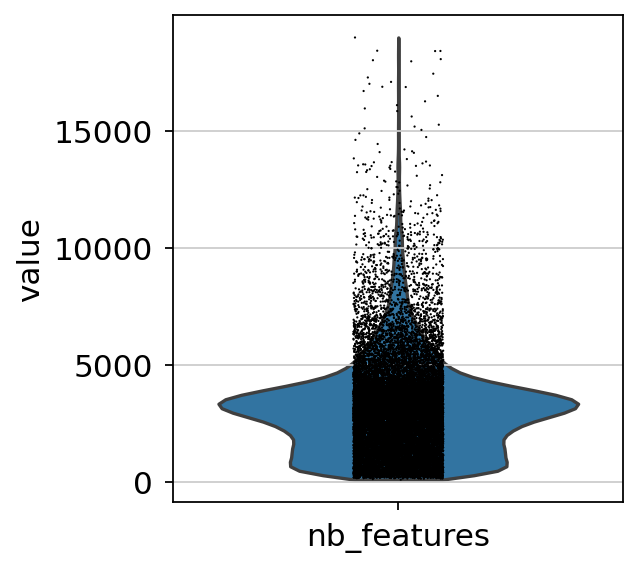

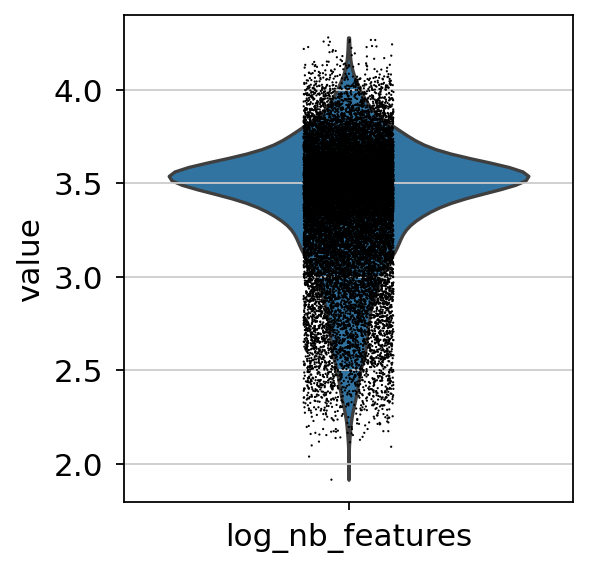

In [13]:
epi.pl.violin(adata_atac, ["nb_features"])
epi.pl.violin(adata_atac, ["log_nb_features"])

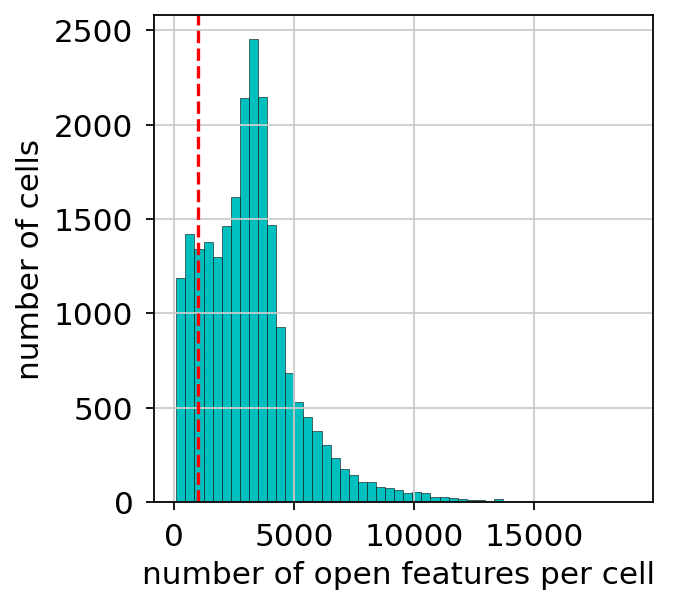

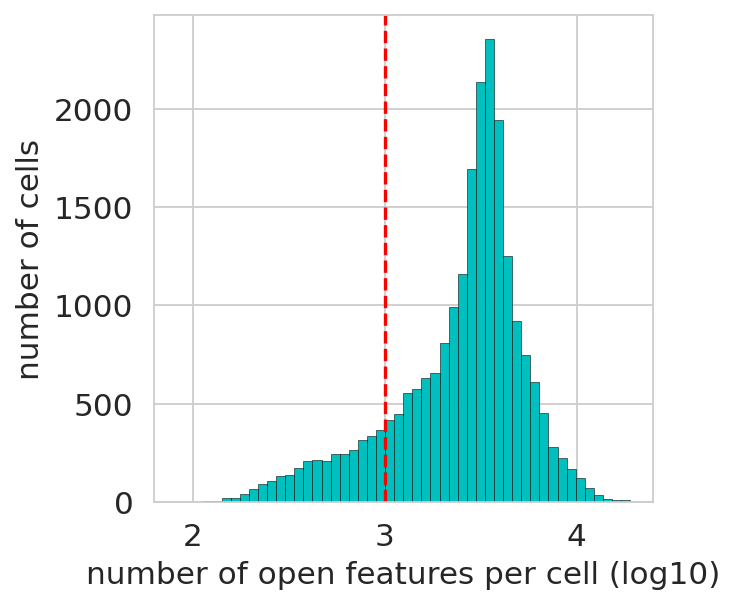

In [14]:
# Set a minimum numberof cells to keep
min_features = 1000

epi.pp.coverage_cells(
    adata_atac, 
    binary = True, 
    log = False, 
    bins = 50,
    threshold = min_features,
    save = "OpenBio_Peaks_Coverage_Cells.png"
)

epi.pp.coverage_cells(
    adata_atac,
    binary = True,
    log = 10, 
    bins = 50,
    threshold = min_features,
    save = "OpenBio_Peaks_Coverage_Cells_log10.png"
)

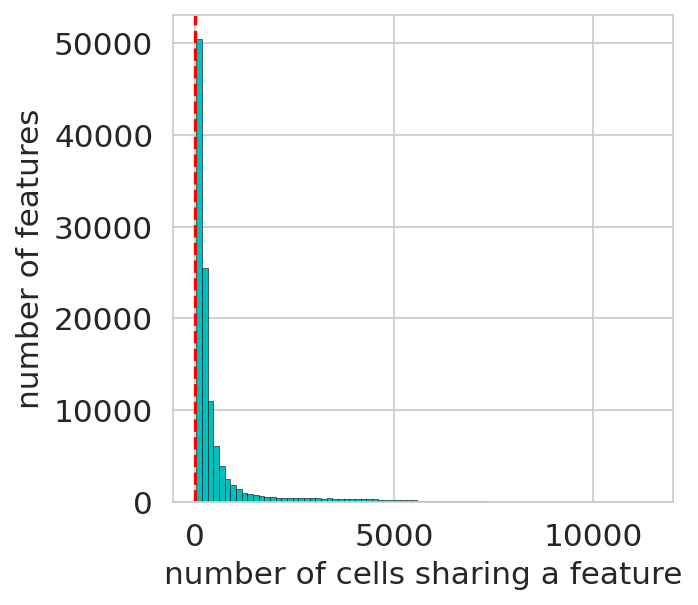

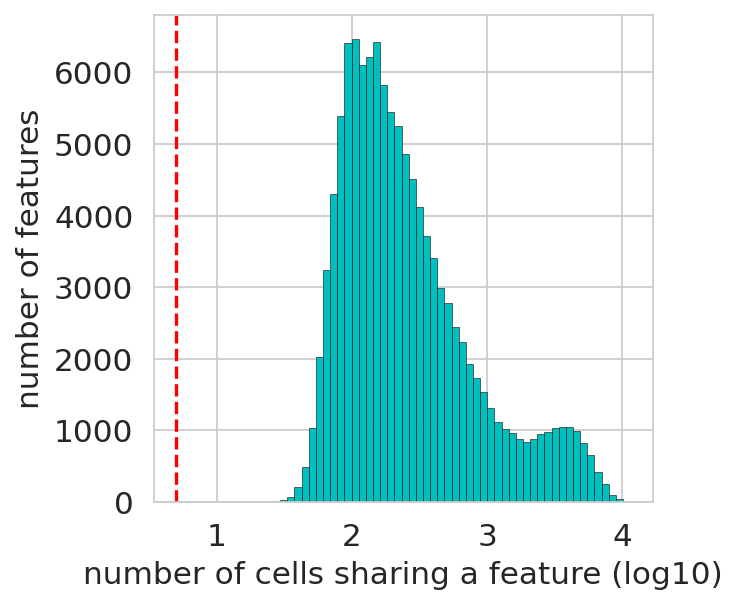

In [15]:
# Minimum number of cells sharing a feature
min_cells = 5
epi.pp.coverage_features(
    adata_atac,
    binary = True,
    log = False,
    threshold = min_cells,
    save = "OpenBio_Peaks_Coverage_Peaks.png"
)

epi.pp.coverage_features(
    adata_atac,
    binary = True,
    log = True,
    threshold = min_cells,
    save = "OpenBio_Peaks_Coverage_Peaks_log10.png"
)

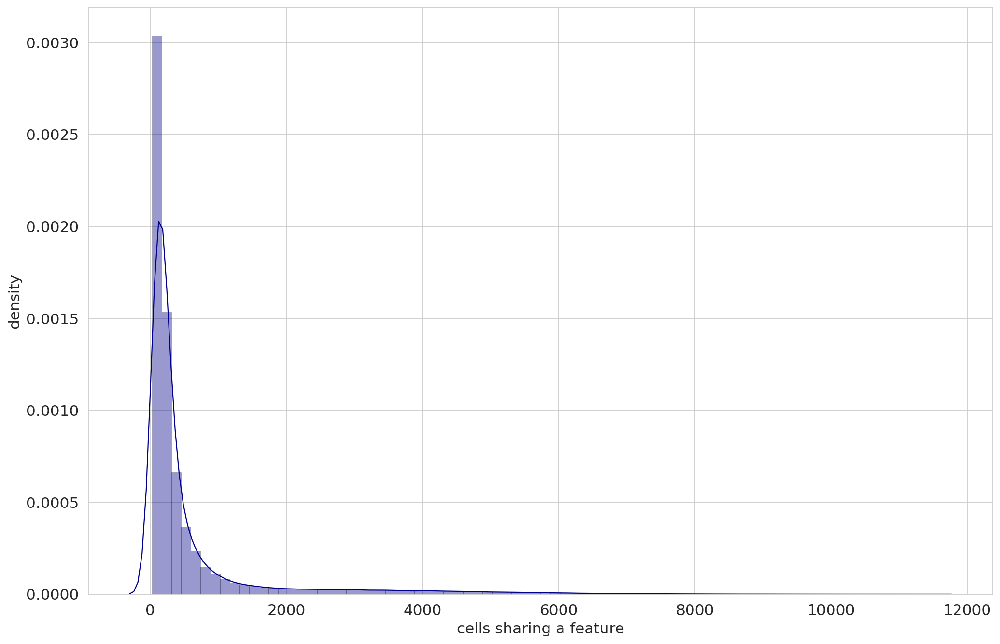

In [16]:
epi.pp.density_features(adata_atac, hist = True)

In [17]:
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 22463 observations and 116490 features.


In [18]:
min_cells = 5
min_features = 5000 
epi.pp.filter_cells(adata_atac, min_features = min_features)
epi.pp.filter_features(adata_atac, min_cells = min_cells)
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 2945 observations and 116490 features.


### Looking at the QC plots after filtering

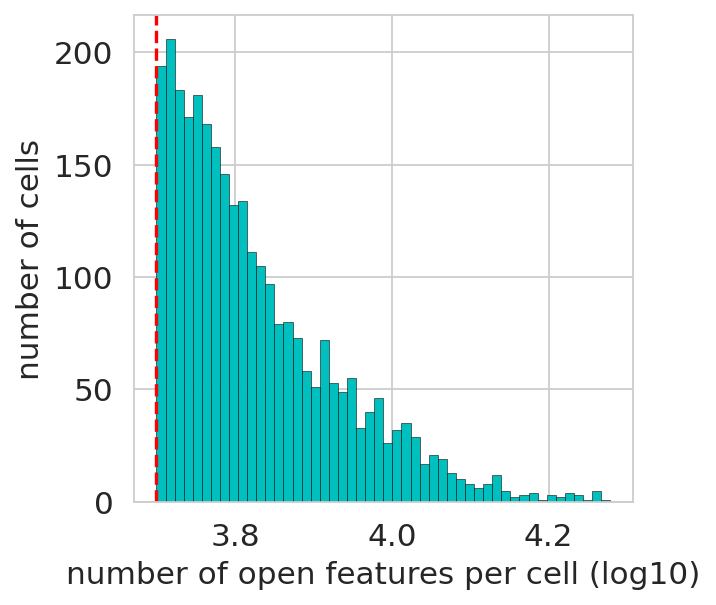

In [19]:
epi.pp.coverage_cells(
    adata_atac,
    binary = True,
    log = "log10",
    bins = 50,
    threshold = min_features
)

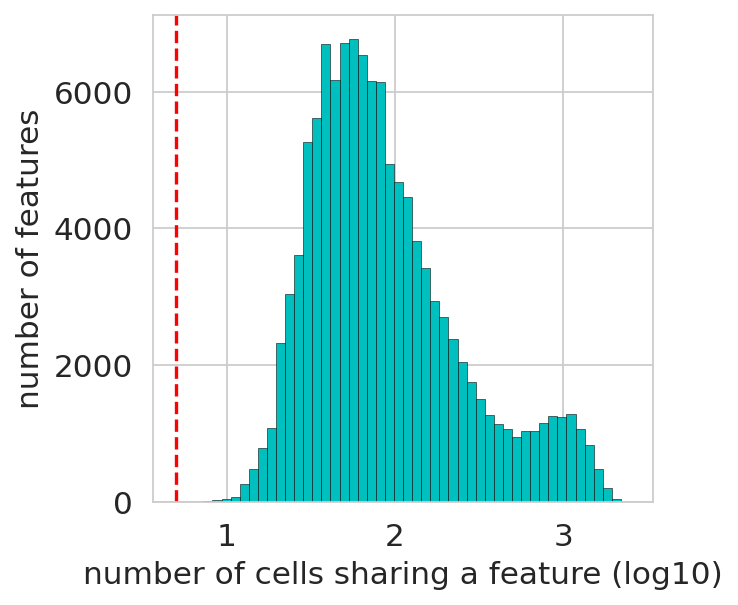

In [20]:
epi.pp.coverage_features(
    adata_atac, 
    binary = True, 
    log = "log10", 
    bins = 50, 
    threshold = min_cells
)

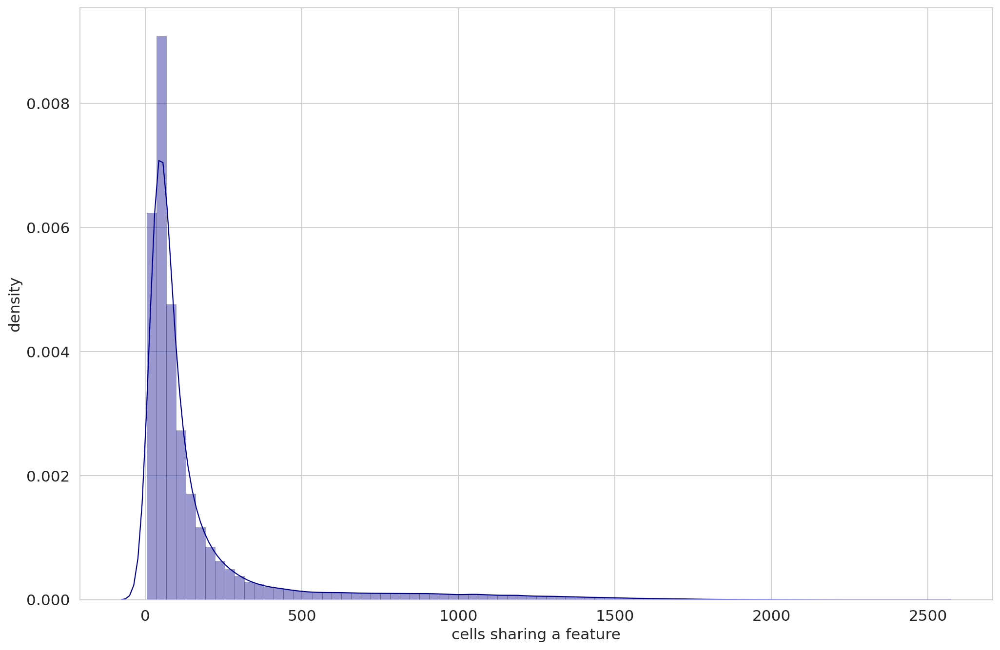

In [21]:
epi.pp.density_features(adata_atac, hist = True)

### Identifying the most variable features

We aim to select a cuttof afet the elbow

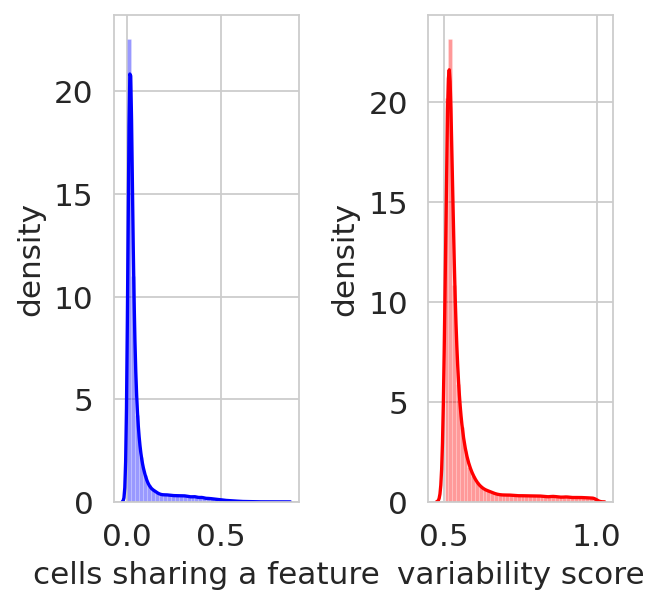

In [22]:
epi.pp.cal_var(adata_atac)

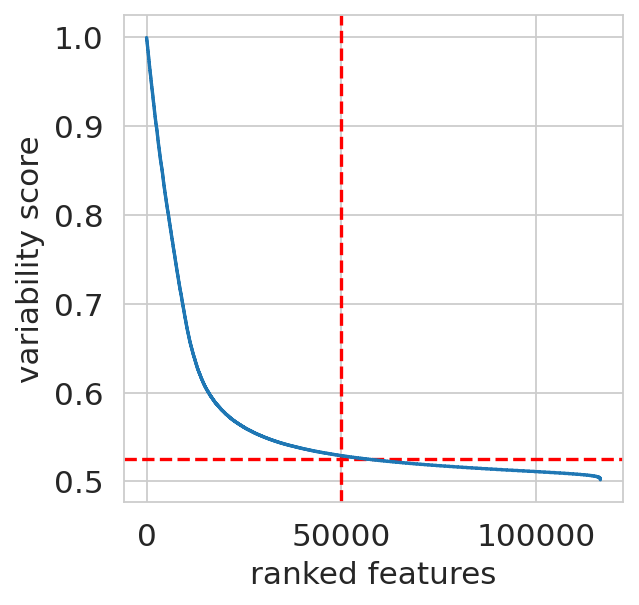

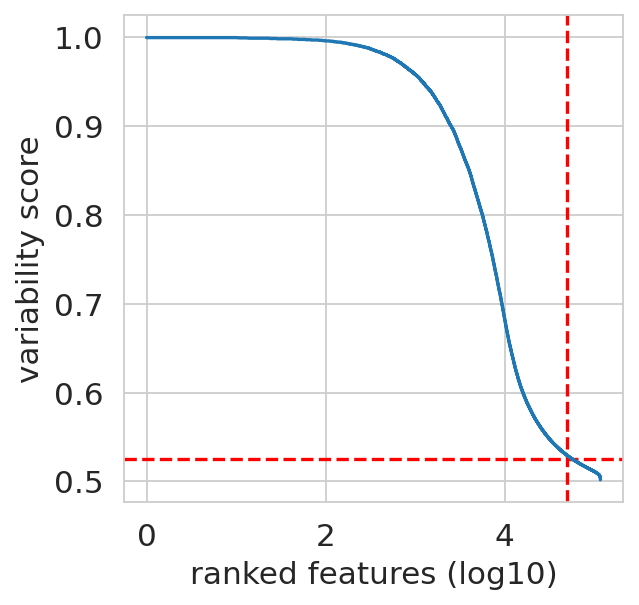

In [23]:
min_score_value = 0.525
nb_feature_selected = 50000

epi.pl.variability_features(
    adata_atac,
    log = None,
    min_score = min_score_value, 
    nb_features = nb_feature_selected,
    save = "variability_features_plot_bonemarrow_peakmatrix.png"
)

epi.pl.variability_features(
    adata_atac,
    log = "log10",
    min_score = min_score_value, 
    nb_features = nb_feature_selected,
    save = "variability_features_plot_bonemarrow_peakmatrix_log10.png")

In [24]:
# Save the curent matrix in the raw layer
adata_atac.raw = adata_atac

In [26]:
# Creates a new AnnData containing only the most variable features
adata_atac = epi.pp.select_var_feature(
    adata_atac,
    nb_features = nb_feature_selected,
    show = False,
    copy = True
)

Trying to set attribute `.var` of view, copying.


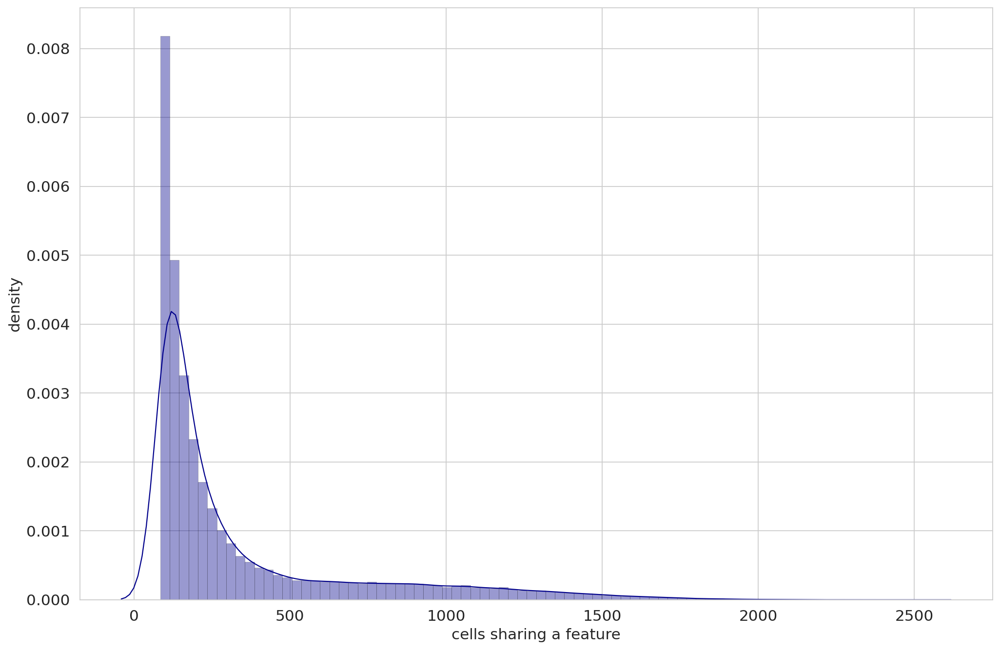

In [27]:
epi.pp.density_features(adata_atac, hist = True)

In [28]:
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 2945 observations and 50213 features.


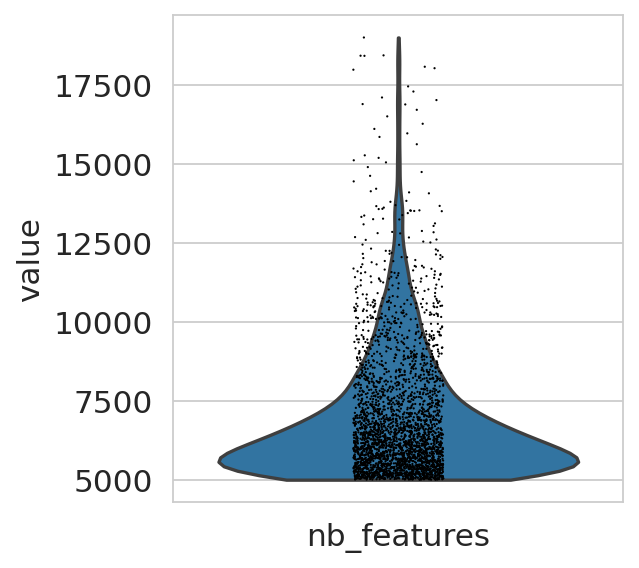

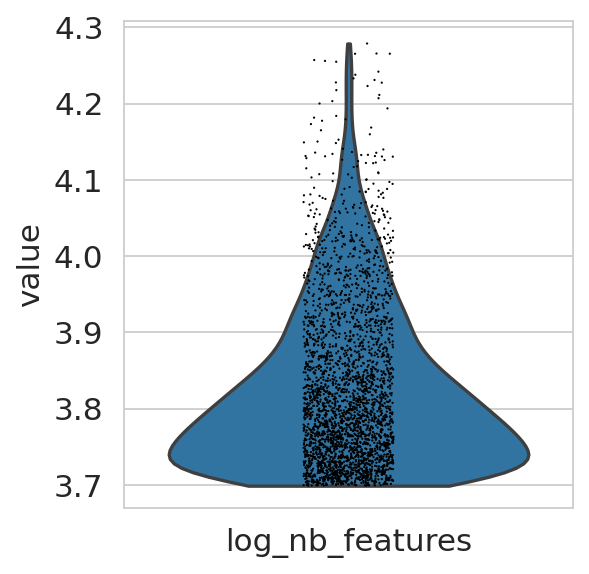

In [29]:
epi.pl.violin(adata_atac, ["nb_features"])
epi.pl.violin(adata_atac, ["log_nb_features"])

In [30]:
epi.pp.filter_cells(adata_atac, min_features = 2000)
epi.pp.filter_cells(adata_atac, max_features = 25000)

In [31]:
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 2945 observations and 50213 features.


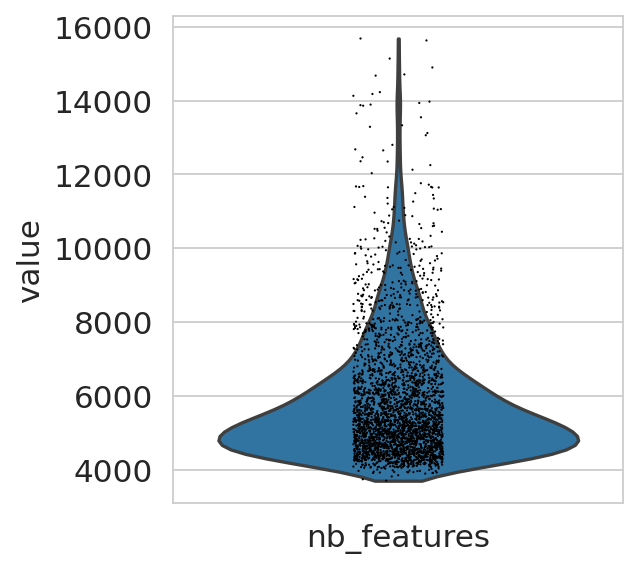

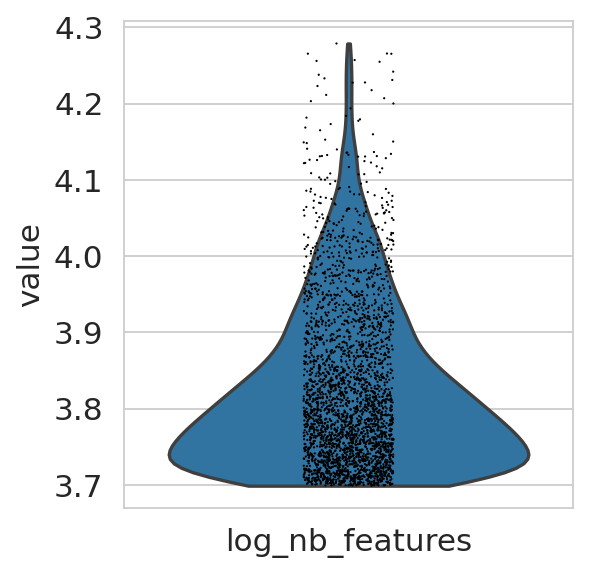

In [32]:
epi.pl.violin(adata_atac, ["nb_features"])
epi.pl.violin(adata_atac, ["log_nb_features"])

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">2.2 Lazy</h1></span>

The `lazy` function compute **PCA**, `neighbor graph` **UMAP** and **T-SNE** *embeddings*

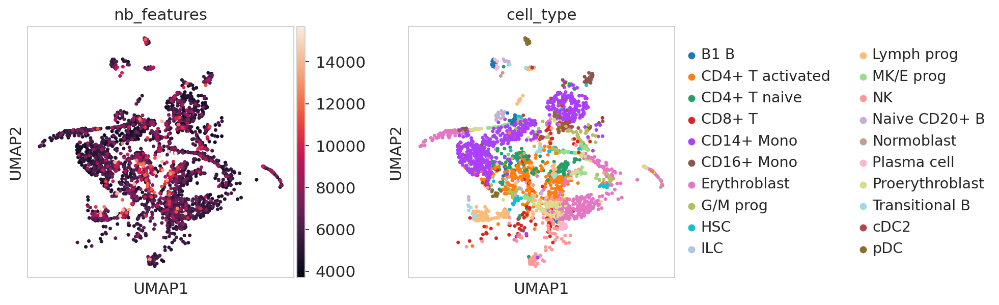

CPU times: user 2min 11s, sys: 40.1 s, total: 2min 51s
Wall time: 1min 48s


In [33]:
%%time
epi.pp.lazy(adata_atac)
sc.pl.umap(
    adata_atac,
    color = ["nb_features", "cell_type"],
    wspace = 0.3
)

In [34]:
# Save the current version of the matrix (binary, not normalised) in a layer of the Anndata.
adata_atac.layers["binary"] = adata_atac.X.copy()

## Library size correction

In [35]:
### I couldn't run this
#epi.pp.normalize_total(adata_atac)

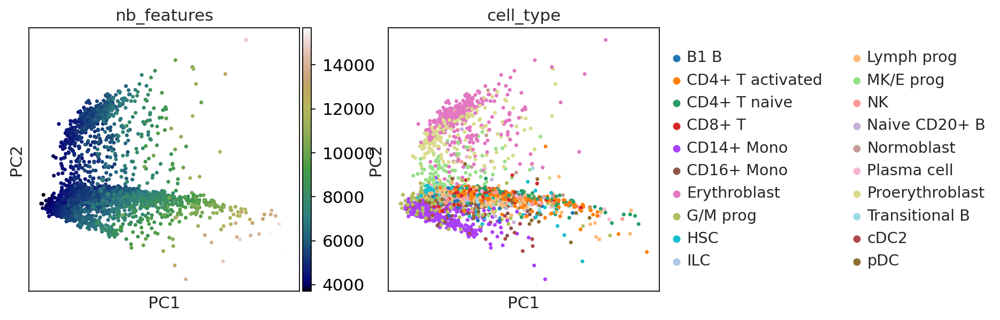

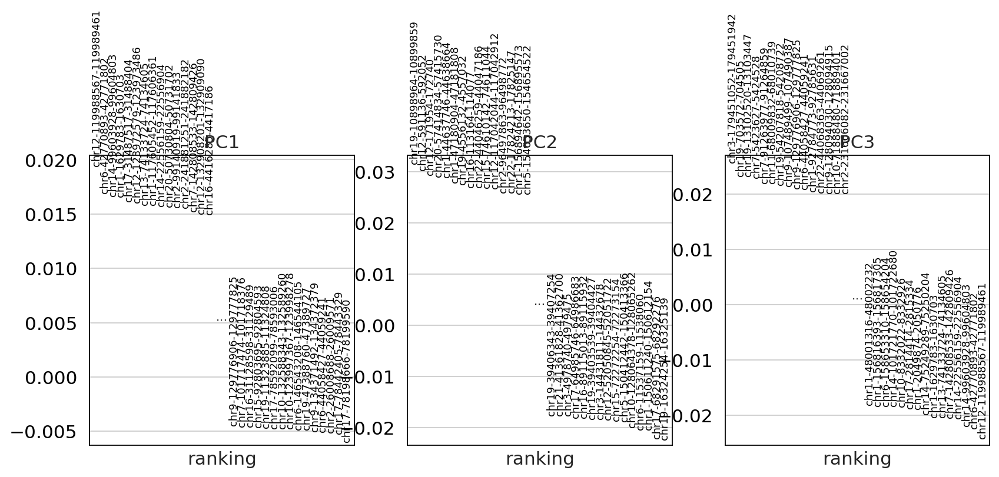

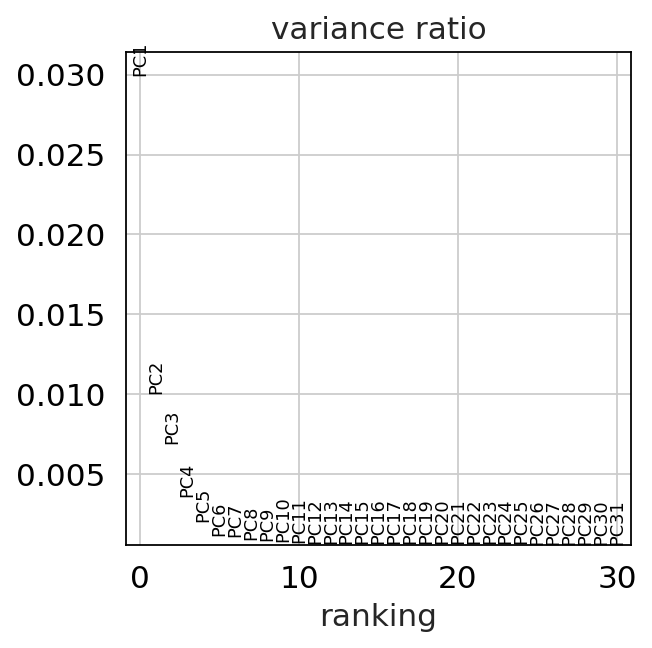

In [36]:
sc.settings.set_figure_params(dpi = 80, color_map = "gist_earth")
epi.pl.pca_overview(adata_atac, color = ["nb_features", "cell_type"])

In [37]:
%%time
epi.pp.lazy(adata_atac)

CPU times: user 1min 48s, sys: 40 s, total: 2min 28s
Wall time: 1min 23s


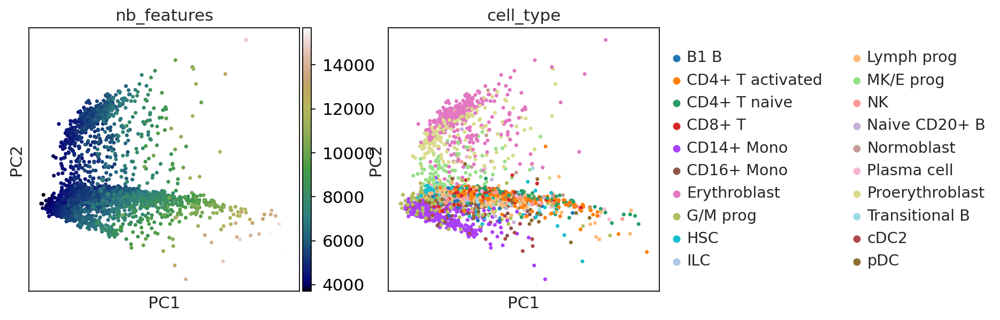

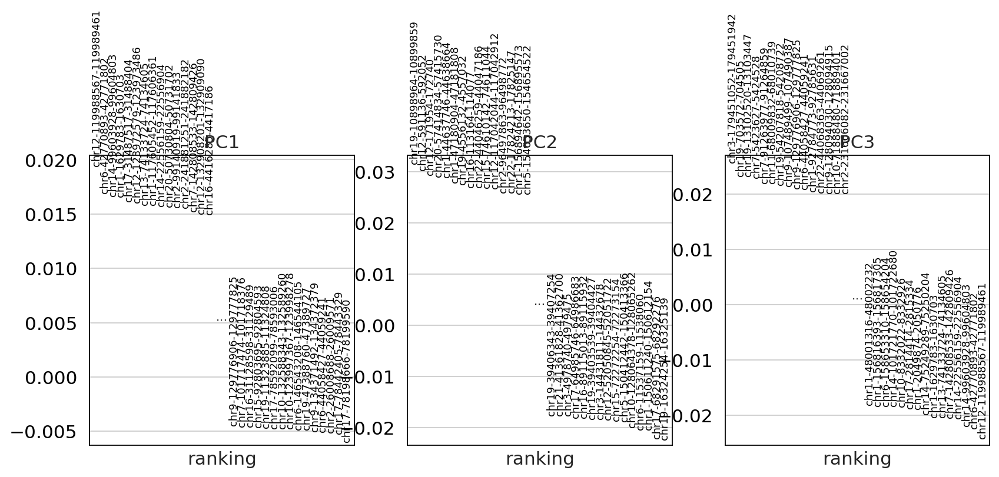

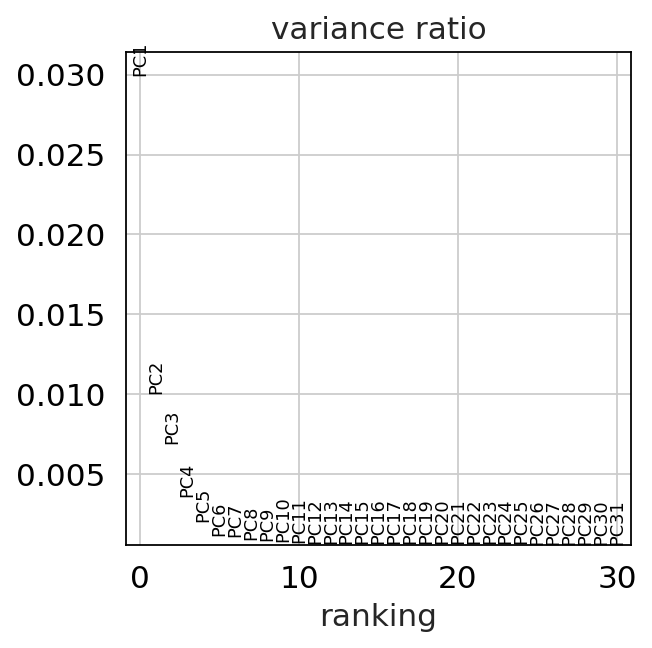

In [38]:
epi.pl.pca_overview(
    adata_atac, 
    color = ["nb_features", "cell_type"]
)

correlation: 0.9023297592075784
pval: 0.0


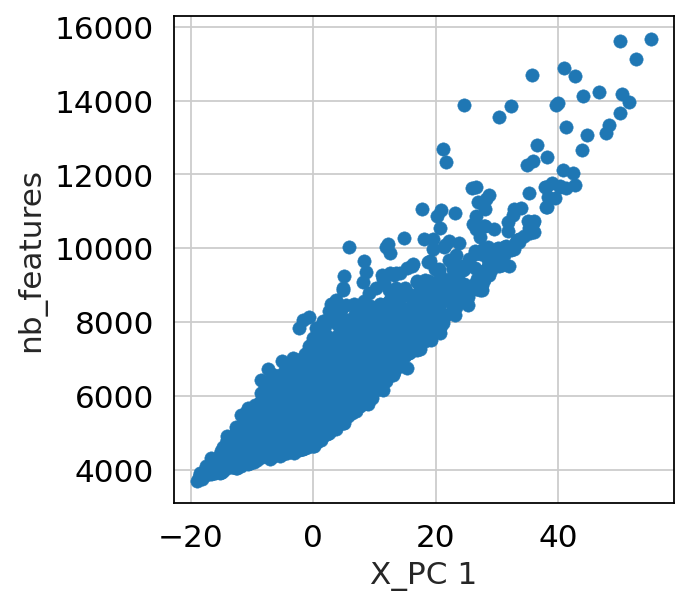

In [39]:
epi.pp.correlation_pc(adata_atac, "nb_features")

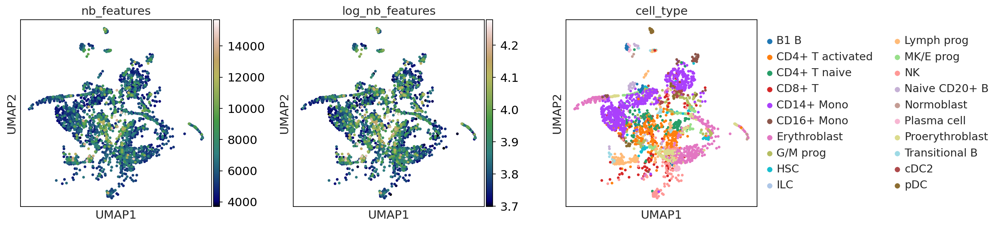

In [40]:
epi.pl.umap(
    adata_atac,
    color = ["nb_features", "log_nb_features", "cell_type"],
    wspace = 0.3
)

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">2.3 Log Transform</h1></span>

This isn't a mandatory step. It really depends on the dataset. Here, the number of features recovered per cell vary greatly. Thus, it benefits from a log transformation after normalisation.

In [41]:
%%time
epi.pp.log1p(adata_atac)
epi.pp.lazy(adata_atac)

CPU times: user 1min 46s, sys: 39.7 s, total: 2min 26s
Wall time: 1min 21s


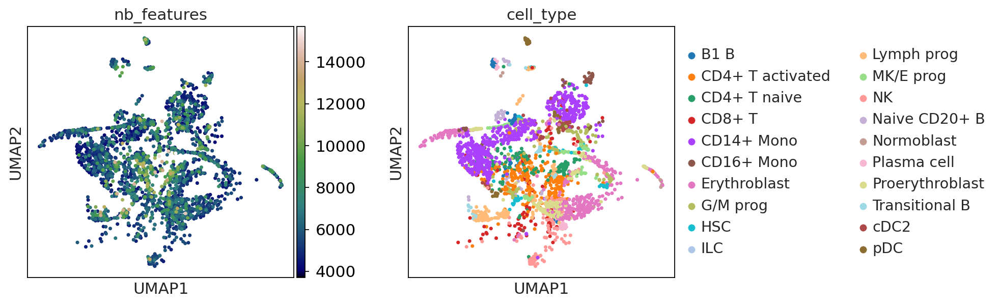

In [42]:
epi.pl.umap(
    adata_atac,
    color = ["nb_features", "cell_type"],
    wspace = 0.3
)

In [43]:
print(f"{b_}The ATAC data has {r_}{adata_atac.n_obs}{b_} observations and {r_}{adata_atac.n_vars}{b_} features.")

The ATAC data has 2945 observations and 50213 features.


# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">3. Cell Clustering</h1></span> 

## a) Louvain clustering

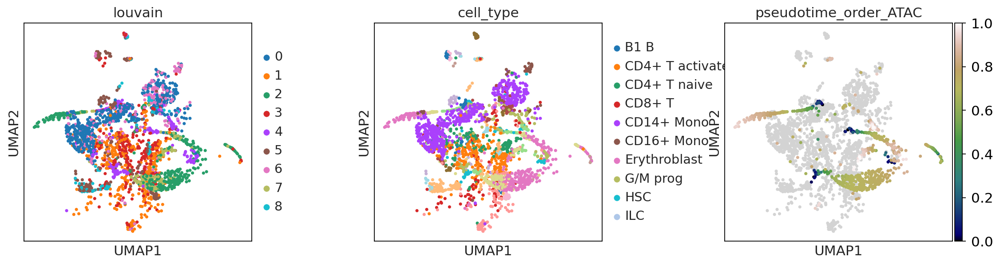

In [44]:
epi.tl.louvain(adata_atac)

epi.pl.umap(
    adata_atac,
    color = ["louvain", "cell_type", "pseudotime_order_ATAC"],
    wspace = 0.4
)

In [45]:
adata_atac.obs["cell_type"].nunique()

20

The original number of "cell_type" is 21.

In [46]:
epi.tl.getNClusters(
    adata_atac,
    n_cluster = 20 # Number of Cell Types
)

step 0
got 15 at resolution 1.5
step 1
got 19 at resolution 2.25
step 2
got 21 at resolution 2.625
step 3
got 21 at resolution 2.4375
step 4
got 20 at resolution 2.34375


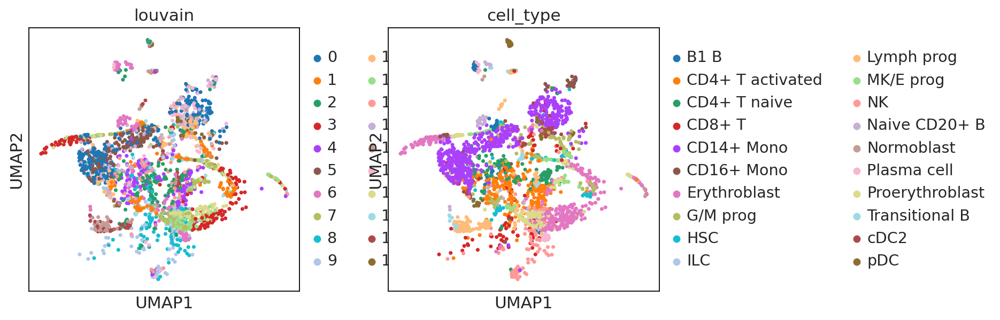

In [47]:
epi.pl.umap(
    adata_atac,
    color = ["louvain", "cell_type"]
)

### b) KMeans clustering

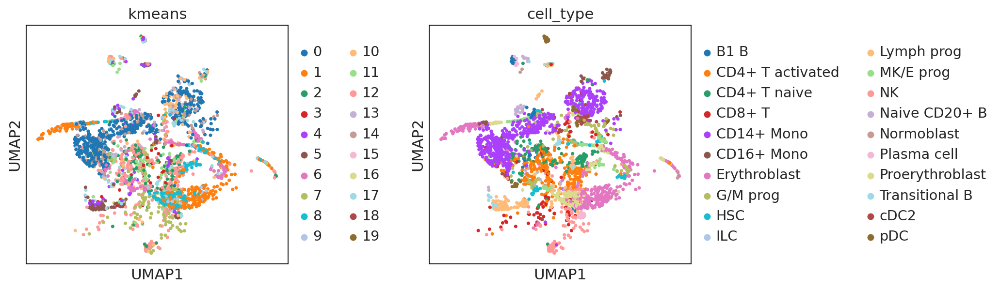

In [48]:
epi.tl.kmeans(adata_atac, num_clusters = 20)

epi.pl.umap(adata_atac, color = ["kmeans", "cell_type"], wspace = 0.4)

### b) Hierarchical clustering

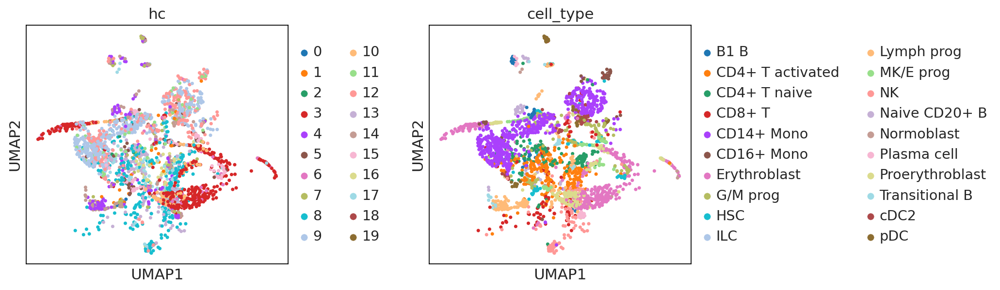

In [49]:
epi.tl.hc(adata_atac, num_clusters = 20)

epi.pl.umap(adata_atac, color = ["hc", "cell_type"], wspace = 0.4)

### d) Leiden clustering

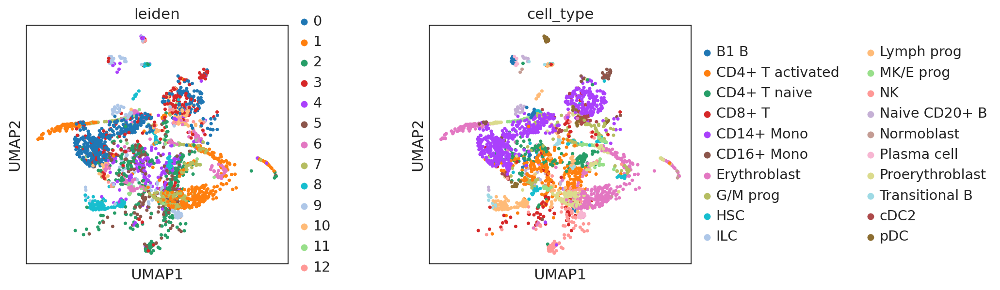

In [50]:
epi.tl.leiden(adata_atac)

epi.pl.umap(adata_atac, color = ["leiden", "cell_type"], wspace = 0.4)

In [51]:
epi.tl.getNClusters(adata_atac, n_cluster = 20, method = "leiden")

step 0
got 18 at resolution 1.5
step 1
got 22 at resolution 2.25
step 2
got 21 at resolution 1.875
step 3
got 20 at resolution 1.6875


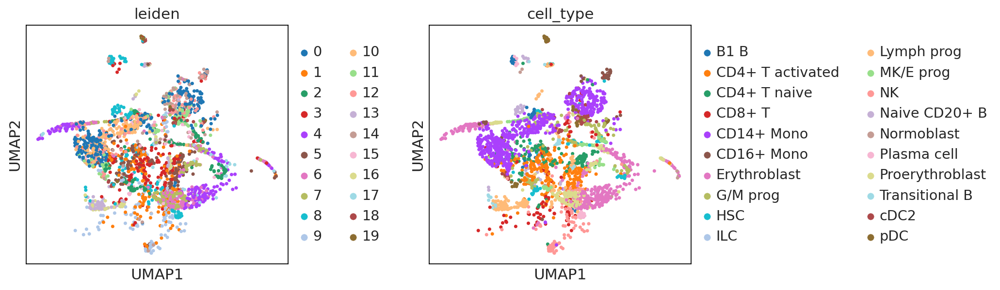

In [52]:
epi.pl.umap(adata_atac, color = ["leiden", "cell_type"], wspace = 0.4)

### e) Comparison and Adjusted Rand Index (ARI)

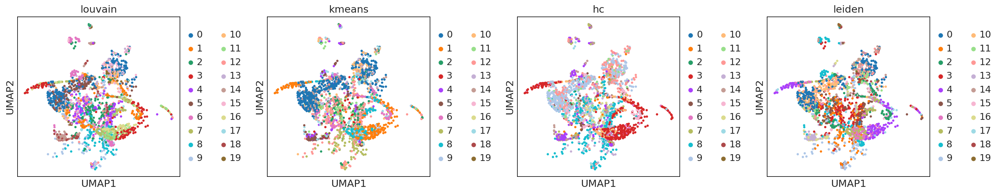

In [53]:
# Clusters
epi.pl.umap(
    adata_atac, 
    color = ["louvain", "kmeans", "hc", "leiden"], 
    wspace = 0.4
)

**A few metrics to compare the quality of the different clusterings.**

For all these methods. The best value possible is 1.

1) Compute the **Adjusted Rand Index** for the diffrent clustering to determine which one perform best. It computes a similarity measure between two clusterings (predicted and true labels) by counting cells that are assigned in the same or different clusters between the two clusterings.

In [54]:
print(b_,"louvain:\t", r_, epi.tl.ARI(adata_atac, "louvain", "cell_type"))
print(b_,"kmeans:\t", r_, epi.tl.ARI(adata_atac, "kmeans", "cell_type"))
print(b_,"hc:\t", r_, epi.tl.ARI(adata_atac, "hc", "cell_type"))
print(b_,"leiden:\t", r_, epi.tl.ARI(adata_atac, "leiden", "cell_type"))

 louvain:	  0.3099801929556942
 kmeans:	  0.4345216132573507
 hc:	  0.41140443163584817
 leiden:	  0.3317294507544655


2) Compute the **homegeneity score**. The score is higher when the different clusters contain only cells with the same ground truth label

In [55]:
print(b_,"louvain:\t", r_, epi.tl.homogeneity(adata_atac, "louvain", "cell_type"))
print(b_,"kmeans:\t", r_, epi.tl.homogeneity(adata_atac, "kmeans", "cell_type"))
print(b_,"hc:\t", r_, epi.tl.homogeneity(adata_atac, "hc", "cell_type"))
print(b_,"leiden:\t", r_, epi.tl.homogeneity(adata_atac, "leiden", "cell_type"))

 louvain:	  0.5145328470819681
 kmeans:	  0.49899601949998784
 hc:	  0.5311980460381498
 leiden:	  0.5438632134014332


3) Compute the **Adjusted Mutual Information**, it is a measure of the similarity between two labels of the same data, while accounting for chance (the MI is generally higher for two set of labels with a large number of clusters)

In [56]:
print(b_,"louvain:\t", r_, epi.tl.AMI(adata_atac, "louvain", "cell_type"))
print(b_,"kmeans:\t", r_, epi.tl.AMI(adata_atac, "kmeans", "cell_type"))
print(b_,"hc:\t", r_, epi.tl.AMI(adata_atac, "hc", "cell_type"))
print(b_,"leiden:\t", r_, epi.tl.AMI(adata_atac, "leiden", "cell_type"))

 louvain:	  0.5345134285073243
 kmeans:	  0.4862421060162985
 hc:	  0.5146489173630477
 leiden:	  0.5625810612305963


In [57]:
epi.tl.rank_features(adata_atac, "louvain", omic = "ATAC")

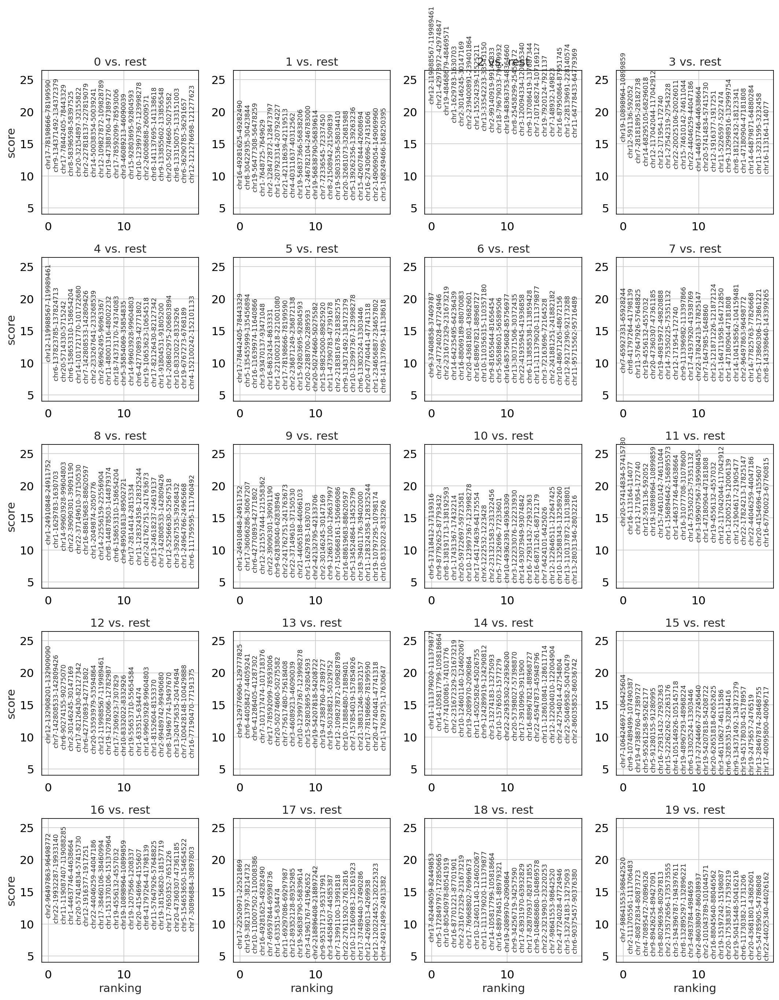

In [58]:
epi.pl.rank_feat_groups(adata_atac)

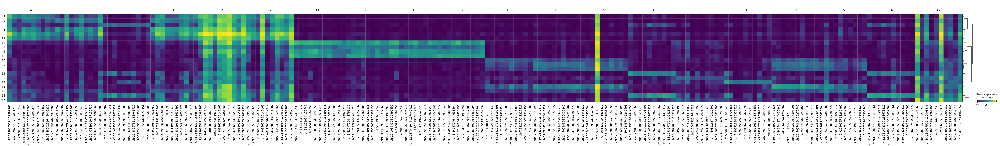

In [73]:
epi.pl.rank_feat_groups_matrixplot(adata_atac, save = "rank_feat_groups_matrixplot.png")

# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">4. PeakVI for scATAC-seq Data</h1></span>

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">4.1 Setup Peakvi</h1></span>

Since i have more than one batch, i'm going to specify this:

In [60]:
scvi.model.PEAKVI.setup_anndata(
    adata_atac, 
    batch_key = "batch"
)

INFO     Using batches from adata.obs["batch"]                                               
INFO     No label_key inputted, assuming all cells have same label                           
INFO     Using data from adata.X                                                             
INFO     Successfully registered anndata object containing 2945 cells, 50213 vars, 5 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              
INFO     Please do not further modify adata until model is trained.                          


## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">4.2 Training PeakVI</h1></span>


Now **PeakVI model object** can be trained

"Importantly: the default max epochs is set to 500, but in practice PeakVI stops early once the model converges, which rarely requires that many, especially for large datasets (which require fewer epochs to converge, since each epoch includes letting the model view more data). So the estimated runtime is sually a substantial overstimate of the actual runtime. In the case of the data we use for this tutorial, it used less than half of the max epochs."

In [61]:
%%time
pvi = scvi.model.PEAKVI(adata_atac)
pvi.train()

Epoch 156/500:  31%|███       | 156/500 [04:57<10:56,  1.91s/it, loss=2.22e+08, v_num=1]
CPU times: user 4min 57s, sys: 1.94 s, total: 4min 59s
Wall time: 5min 3s


### Saving the model

In [62]:
pvi.save("trained_model", overwrite = True)

### Loading the trained model after training

In [63]:
pvi = scvi.model.PEAKVI.load("trained_model", adata_atac)

INFO     Using data from adata.X                                                             


INFO     Registered keys:['X', 'batch_indices', 'labels']                                    
INFO     Successfully registered anndata object containing 2945 cells, 50213 vars, 5 batches,
         1 labels, and 0 proteins. Also registered 0 extra categorical covariates and 0 extra
         continuous covariates.                                                              


### About the model trained

In [64]:
scvi.data.view_anndata_setup(pvi.adata)

Anndata setup with scvi-tools version 0.14.5.

              Data Summary              
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━┓
┃             Data             ┃ Count ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━┩
│            Cells             │ 2945  │
│             Vars             │ 50213 │
│            Labels            │   1   │
│           Batches            │   5   │
│           Proteins           │   0   │
│ Extra Categorical Covariates │   0   │
│ Extra Continuous Covariates  │   0   │
└──────────────────────────────┴───────┘

             SCVI Data Registry              
┏━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃     Data      ┃    scvi-tools Location    ┃
┡━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│       X       │          adata.X          │
│ batch_indices │ adata.obs['_scvi_batch']  │
│    labels     │ adata.obs['_scvi_labels'] │
└───────────────┴───────────────────────────┘

                        Label Categories                        
┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃      Source Location      ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['_scvi_labels'] │     0      │          0          │
└───────────────────────────┴────────────┴─────────────────────┘

                    Batch Categories                     
┏━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━┓
┃  Source Location   ┃ Categories ┃ scvi-tools Encoding ┃
┡━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━┩
│ adata.obs['batch'] │    s1d1    │          0          │
│                    │    s1d2    │          1          │
│                    │    s2d1    │          2          │
│                    │    s2d4    │          3          │
│                    │    s3d6    │          4          │
└────────────────────┴────────────┴─────────────────────┘

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">4.3 Visualizing and Analyzing the Latent Space</h1></span>

The trained model to visualize, cluster, and analyze the data. We first extract the latent representation from the model, and save it back into out AnnData object:

In [65]:
latent = pvi.get_latent_representation()
adata_atac.obsm["X_PeakVI"] = latent
print(latent.shape)

(2945, 14)


Now i can use **EpiScanpy** functions to cluster and visualize our latent space:

In [66]:
%%time
# Compute the kNN graph taht is used to both clustering and umap algorithms
epi.pp.neighbors(adata_atac, use_rep = "X_PeakVI")
# Compute the umap
epi.tl.umap(adata_atac, min_dist = 0.2)
# Cluster the space (we use a lower resolution toget fewer clusters than the defautl)
epi.tl.leiden(adata_atac, key_added = "cluster_pvi", resolution = 0.2)

CPU times: user 15.7 s, sys: 140 ms, total: 15.9 s
Wall time: 15.7 s


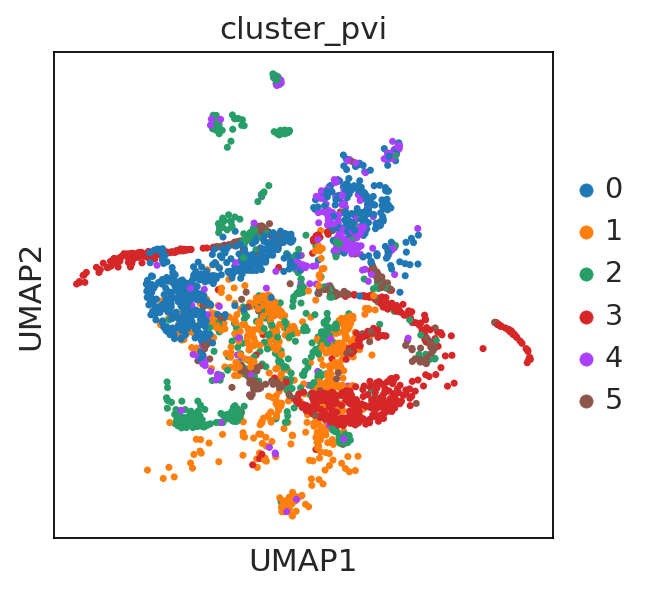

In [72]:
epi.pl.umap(
    adata_atac, 
    color = "cluster_pvi", 
    save = "peakvi_latent_space.png"
)

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">4.4 Differential Accessibility</h1></span>

"[...] we can use **PeakVI** to identify regions that are **differentially accessible**. There are many different ways to run this analysis, but the simplest is comparing one cluster against all others, or comparing two clusters to each other. In the first case we'll be looking for marker-regions, so we'll mostly want a one-sided test (the significant regions will only be the ones preferentially accessible in out target cluster). In the second case we'll use the two-sided test to find regions that are differentially accessible, regarless of direction."

Two different ways: 
1. **More convenient but less flexible**: using an existing factor to group the cells, and then comparing groups. 
2. **More flexible**: using cell indices directly.

My data has multiple batches, therefore i'm going to use `batch_correction = True`. The model will sample from multiple batches to compute the **differential signal**.

In [68]:
## (1.1) Using a known factor to compare two clusters
# Two-sided is True by default, but included here for emphasis
da_res1_1 = pvi.differential_accessibility(
    groupby = "cluster_pvi",
    group1 = '3',
    group2 = '0',
    two_sided = True,
    batch_correction = True
    
)

## (1.2) Using a known factor to compare a cluster against all other clusters
# If we only provide group1, group2 is all other cells by default
da_res1_2 = pvi.differential_accessibility(
    groupby = "cluster_pvi",
    group1 = '3',
    two_sided = False,
    batch_correction = True
)

DE...: 100%|██████████| 1/1 [00:25<00:00, 25.08s/it]


In [70]:
## (2.1) Using indices to compare two clusters
# We can use boolean masks or integer indices for the "idx1" and "idx2" arguments
da_res2_1 = pvi.differential_accessibility(
    idx1 = adata_atac.obs.cluster_pvi == '3',
    idx2 = adata_atac.obs.cluster_pvi == '0',
    two_sided = True,
    batch_correction = True
)

## (2.2) Using indices to compare a cluster against all other clusters
# If we don't provide idx2, it uses all other cells as the contrast
da_res2_2 = pvi.differential_accessibility(
    idx1 = np.where(adata_atac.obs.cluster_pvi == '3'),
    two_sided = False,
    batch_correction = True
)

DE...: 100%|██████████| 1/1 [00:23<00:00, 23.94s/it]


>"Note that da_res11 and da_res21 are equivalent, as are da_res12 and da_res22. The return value is a pandas DataFrame with the differential results and basic properties of the comparison:

>prob_da in our case is the probability of cells from cluster 0 being more than 0.05 (the default minimal effect) more accessible than cells from the rest of the data.

>is_da_fdr is a conservative classification (True/False) of whether a region is differential accessible. This is one way to threshold the results.

>bayes_factor is a statistical significance score. It doesn’t have a commonly acceptable threshold (e.g 0.05 for p-values), bu we demonstrate below that it’s well calibrated to the effect size.

>effect_size is the effect size, calculated as est_prob1 - est_prob2.

>emp_effect is the empirical effect size, calculated as emp_prob1 - emp_prob2.

>est_prob{1,2} are the estimated probabilities of accessibility in group1 and group2.

>emp_prob{1,2} are the empirical probabilities of detection (how many cells in group X was the region detected in)."

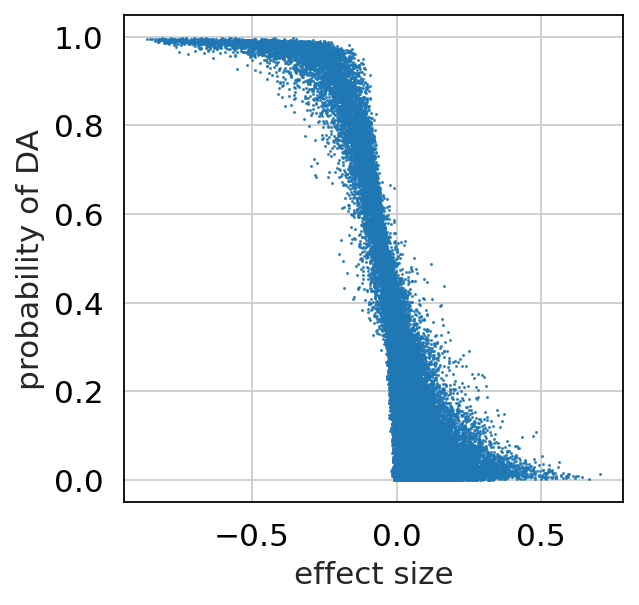

,prob_da,is_da_fdr,bayes_factor,effect_size,emp_effect,est_prob1,est_prob2,emp_prob1,emp_prob2
chr4-70903131-70903840,0.9982,True,6.318161,-0.659984,-0.298499,0.719319,0.059335,0.323268,0.024769
chr1-203311522-203312409,0.9974,True,5.949637,-0.358561,-0.170775,0.488586,0.130024,0.229130,0.058354
chr15-64134234-64135133,0.9972,True,5.875328,-0.423625,-0.184370,0.445406,0.021781,0.193606,0.009236
chr9-123304460-123305381,0.9970,True,5.806135,-0.740806,-0.367158,0.834882,0.094076,0.412078,0.044920
chr4-169626662-169627656,0.9968,True,5.741396,-0.676652,-0.290070,0.719398,0.042746,0.307282,0.017212
chr8-8777522-8778390,0.9968,True,5.741396,-0.701392,-0.306702,0.728980,0.027588,0.319716,0.013014
chr8-23493867-23494742,0.9966,True,5.680571,-0.780427,-0.365510,0.816780,0.036354,0.381883,0.016373
chr2-30252702-30253575,0.9966,True,5.680571,-0.572475,-0.249444,0.652423,0.079949,0.285968,0.036524
chr20-57409881-57410726,0.9964,True,5.623212,-0.728000,-0.328953,0.811861,0.083862,0.365897,0.036944
chr19-15451930-15452828,0.9964,True,5.623212,-0.578054,-0.261845,0.679411,0.101357,0.305506,0.043661


In [74]:
plt.scatter(da_res2_2.effect_size, da_res2_2.prob_da, s = 1)
plt.xlabel("effect size")
plt.ylabel("probability of DA")
plt.show()

da_res2_2.loc[da_res2_2.is_da_fdr].sort_values("prob_da", ascending = False).head(10)

# <span><h1 style = "font-family: garamond; font-size: 40px; font-style: normal; letter-spcaing: 3px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">5. References</h1></span>





## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">5.1 Papers</h1></span>

- Danese, A., Richter, M. L., Chaichoompu, K., Fischer, D. S., Theis, F. J., & Colomé-Tatché, M. (2021). EpiScanpy: integrated single-cell epigenomic analysis. Nature communications, 12(1), 1-8.
- Gayoso, A., Lopez, R., Xing, G., Boyeau, P., Wu, K., Jayasuriya, M., ... & Yosef, N. (2021). scvi-tools: a library for deep probabilistic analysis of single-cell omics data. bioRxiv.
- Ashuach, T., Reidenbach, D. A., Gayoso, A., & Yosef, N. (2021). PeakVI: A Deep Generative Model for Single Cell Chromatin Accessibility Analysis. bioRxiv.

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">5.2 Documentation</h1></span>

- **[EpiScanpy](https://episcanpy.readthedocs.io/en/latest/)**
- **[scvi-tools](https://scvi-tools.org/)**

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">5.3 Notebooks</h1></span>

- [Preprocessing and clustering scATAC PBMCs](https://nbviewer.org/github/colomemaria/epiScanpy/blob/master/docs/tutorials/Buenrostro_PBMC_data_processing.html)
- [PeakVI: Analyzing scATACseq data](https://docs.scvi-tools.org/en/stable/tutorials/notebooks/PeakVI.html)

## <span><h1 style = "font-family: garamond; font-size: 30px; font-style: normal; letter-spcaing: 1.5px; background-color: #B3E5FC; color :  #0277BD; border-radius: 100px 100px; text-align:center">5.4 My Related Works</h1></span>

- [scRNA-seq 🧬: Scanpy & SCMER for Feature Selection](https://www.kaggle.com/hiramcho/scrna-seq-scanpy-scmer-for-feature-selection#4.-References)
- [scRNA-seq 🧬: scGAE with Spektral and RAPIDS](https://www.kaggle.com/hiramcho/scrna-seq-scgae-with-spektral-and-rapids#5.-References)